# Dataset Processing Pipeline

This notebook processes and validates image-label pairs for the plant species object detection dataset. It:
- Validates image-label pairing across all species
- Fixes label class IDs to match class mapping
- Copies valid pairs to intermediate/final folders
- Generates dataset statistics

## Setup & Configuration

Define folder structure and class mappings:
- **RAW_DIR**: Original source data with images and labels
- **INT_DIR**: Intermediate storage after validation and class fix
- **FINAL_DIR**: Final cleaned dataset ready for training

In [1]:
from pathlib import Path
import shutil
from collections import Counter

import cv2
import matplotlib.pyplot as plt
import math
import random

In [3]:
DATA_DIR = Path(r"D:\Projects\2026 Capstone BRIN\dataset")

RAW_DIR = DATA_DIR / "raw"

INT_DIR = DATA_DIR / "processed"
IMG_INT = INT_DIR / "images"
LBL_INT = INT_DIR / "labels"

FINAL_DIR = DATA_DIR / "final"
IMG_OUT = FINAL_DIR / "images"
LBL_OUT = FINAL_DIR / "labels"

NOISE_DIR = RAW_DIR / "Background"

IMG_INT.mkdir(parents=True, exist_ok=True)
LBL_INT.mkdir(parents=True, exist_ok=True)
IMG_OUT.mkdir(parents=True, exist_ok=True)
LBL_OUT.mkdir(parents=True, exist_ok=True)

In [4]:
# mapping folder
CLASS_MAPPING = {
    "Vachellia nilotica": 0,
    "Ageratum conyzoides": 1,  # Ageratum (fix class 0 → 1)
    "Lantana camara": 2,  
    "Clitoria ternatea": 3,
    "Merremia hederecea": 4   # Merremia (fix class 0 → 4)
}

IMG_EXT = [".jpg", ".png", ".jpeg"]

## Data Validation

Check for mismatched image-label pairs. Identifies:
- Images without corresponding labels
- Labels without corresponding images

In [5]:
def check_pairing():
    for folder, class_id in CLASS_MAPPING.items():
        img_dir = RAW_DIR / folder / "obj_train_img"
        lbl_dir = RAW_DIR / folder / "obj_train_data"

        imgs = {f.stem for f in img_dir.iterdir() if f.suffix.lower() in IMG_EXT}
        lbls = {f.stem for f in lbl_dir.iterdir() if f.suffix == ".txt"}

        missing_lbl = imgs - lbls
        missing_img = lbls - imgs

        print(f"\n📂 {folder}")
        print(f"Images: {len(imgs)}, Labels: {len(lbls)}")

        if missing_lbl:
            print(f"❌ Missing labels: {len(missing_lbl)}")
            print(f"   Files: {sorted(missing_lbl)}")
        if missing_img:
            print(f"❌ Missing images: {len(missing_img)}")
            print(f"   Files: {sorted(missing_img)}")

check_pairing()


📂 Vachellia nilotica
Images: 250, Labels: 250
❌ Missing labels: 1
   Files: ['ageratum_3603']
❌ Missing images: 1
   Files: ['ageratum_3585']

📂 Ageratum conyzoides
Images: 250, Labels: 250

📂 Lantana camara
Images: 252, Labels: 249
❌ Missing labels: 4
   Files: ['img_13', 'img_207', 'img_474', 'img_558']
❌ Missing images: 1
   Files: ['img_60']

📂 Clitoria ternatea
Images: 250, Labels: 250

📂 Merremia hederecea
Images: 267, Labels: 232
❌ Missing labels: 36
   Files: ['merremia_0296', 'merremia_0298', 'merremia_0299', 'merremia_0304', 'merremia_0332', 'merremia_0342', 'merremia_0343', 'merremia_0344', 'merremia_0345', 'merremia_0346', 'merremia_0347', 'merremia_0352', 'merremia_0353', 'merremia_0354', 'merremia_0355', 'merremia_0356', 'merremia_0357', 'merremia_0359', 'merremia_0360', 'merremia_0363', 'merremia_0364', 'merremia_0365', 'merremia_0366', 'merremia_0463', 'merremia_0473', 'merremia_0474', 'merremia_0482', 'merremia_0484', 'merremia_0485', 'merremia_0487', 'merremia_0488',

## Processing to Intermediate

For each valid image-label pair:
- Fix label class IDs to match CLASS_MAPPING
- Standardize filenames with plant species prefix
- Copy to intermediate processed folder

In [6]:
# label class fix and file name standardization for intermediate
def process_to_intermediate():
    for folder, correct_class in CLASS_MAPPING.items():
        img_dir = RAW_DIR / folder / "obj_train_img"
        lbl_dir = RAW_DIR / folder / "obj_train_data"

        imgs = {f.stem: f for f in img_dir.iterdir() if f.suffix.lower() in IMG_EXT}
        lbls = {f.stem: f for f in lbl_dir.iterdir() if f.suffix == ".txt"}

        valid_stems = set(imgs.keys()) & set(lbls.keys())

        safe_folder = folder.replace(" ", "_")

        print(f"\n📂 {folder} → {len(valid_stems)} valid")

        for stem in valid_stems:
            img_src = imgs[stem]
            lbl_src = lbls[stem]

            new_stem = f"{safe_folder}_{stem}"

            img_dst = IMG_INT / f"{new_stem}{img_src.suffix}"
            lbl_dst = LBL_INT / f"{new_stem}.txt"

            # copy image
            shutil.copy2(img_src, img_dst)

            # fix label
            new_lines = []
            with open(lbl_src, "r") as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    parts[0] = str(correct_class)
                    new_lines.append(" ".join(parts))

            with open(lbl_dst, "w") as f:
                f.write("\n".join(new_lines))

    print("\n✅ Processed data ready (INT)")

process_to_intermediate()


📂 Vachellia nilotica → 249 valid

📂 Ageratum conyzoides → 250 valid

📂 Lantana camara → 248 valid

📂 Clitoria ternatea → 250 valid

📂 Merremia hederecea → 231 valid

✅ Processed data ready (INT)


## Dataset Statistics

Generate summary statistics:
- Total images and empty labels
- Object count per class
- Image count per class (for multi-class images)

In [7]:
LABEL_DIR = LBL_INT 

def dataset_statistics(label_dir):
    class_counter = Counter()
    empty_files = 0
    total_files = 0

    for file in label_dir.glob("*.txt"):
        total_files += 1

        with open(file, "r") as f:
            lines = f.readlines()

        if len(lines) == 0:
            empty_files += 1
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls = int(parts[0])
                class_counter[cls] += 1

    print("=== DATASET STATISTICS ===")
    print(f"Total images       : {total_files}")
    print(f"Empty labels       : {empty_files}")
    print("\nObject count per class:")

    for i in range(5): 
        print(f"Class {i}: {class_counter[i]}")

dataset_statistics(LABEL_DIR)

=== DATASET STATISTICS ===
Total images       : 1228
Empty labels       : 15

Object count per class:
Class 0: 586
Class 1: 404
Class 2: 407
Class 3: 266
Class 4: 375


In [8]:
def image_per_class(label_dir):
    class_image_counter = Counter()

    for file in label_dir.glob("*.txt"):
        with open(file, "r") as f:
            lines = f.readlines()

        classes_in_image = set()

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                classes_in_image.add(int(parts[0]))

        for cls in classes_in_image:
            class_image_counter[cls] += 1

    print("\nImage count per class:")
    for i in range(5):
        print(f"Class {i}: {class_image_counter[i]}")

image_per_class(LABEL_DIR)


Image count per class:
Class 0: 249
Class 1: 250
Class 2: 248
Class 3: 241
Class 4: 225


## Empty Label Validation

In [9]:
def list_empty_labels():
    empty_files = []

    for file in LBL_INT.glob("*.txt"):
        if file.stat().st_size == 0:
            empty_files.append(file.stem)

    print(f"Total empty labels: {len(empty_files)}\n")

    for name in empty_files:
        print(name)

    return empty_files

empty_list = list_empty_labels()

Total empty labels: 15

Clitoria_ternatea_image_106
Clitoria_ternatea_image_117
Clitoria_ternatea_image_144
Clitoria_ternatea_image_205
Clitoria_ternatea_image_28
Clitoria_ternatea_image_283
Clitoria_ternatea_image_42
Clitoria_ternatea_image_45
Clitoria_ternatea_image_61
Merremia_hederecea_merremia_0182
Merremia_hederecea_merremia_0245
Merremia_hederecea_merremia_0260
Merremia_hederecea_merremia_0263
Merremia_hederecea_merremia_0334
Merremia_hederecea_merremia_0536


Found 15 empty labels


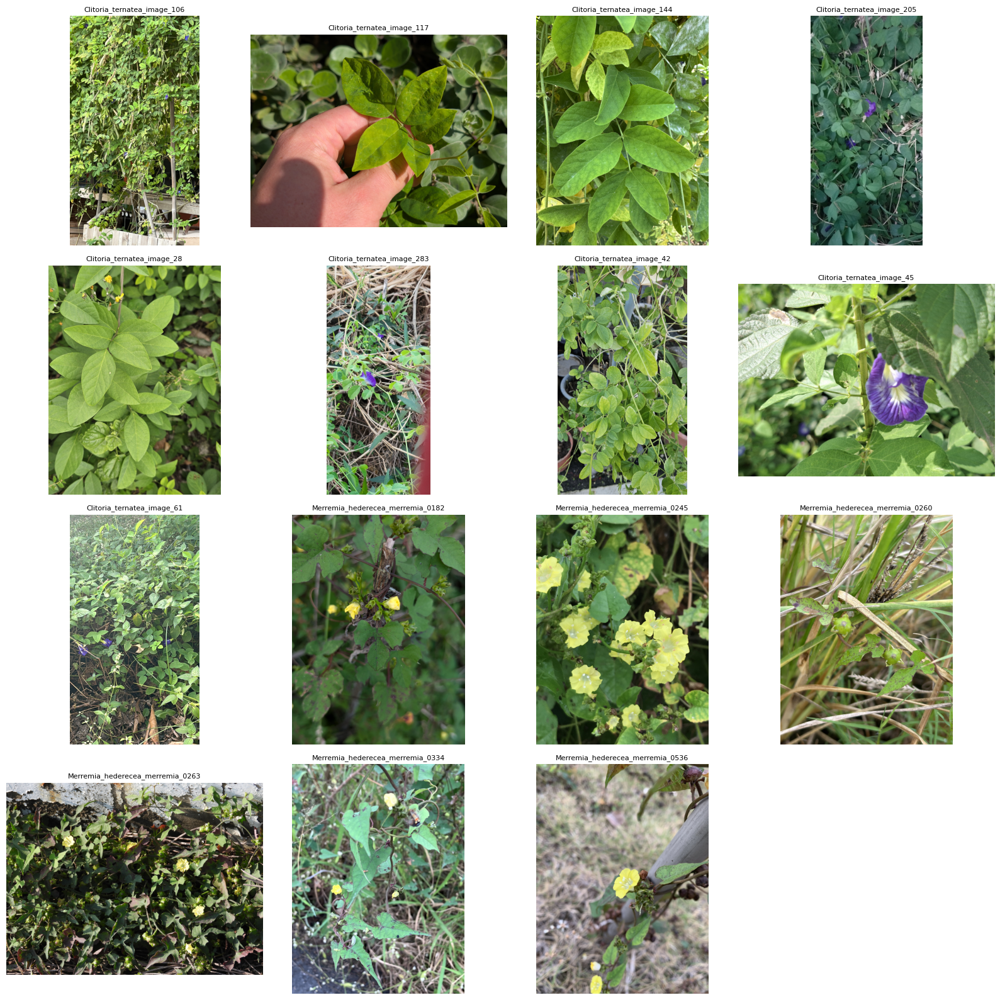

In [10]:
def visualize_empty_labels(limit=None):
    empty_files = []

    for file in LBL_INT.glob("*.txt"):
        if file.stat().st_size == 0:
            empty_files.append(file)

    print(f"Found {len(empty_files)} empty labels")

    if limit:
        empty_files = empty_files[:limit]

    cols = 4
    rows = math.ceil(len(empty_files) / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axes = axes.flatten()

    for i, lbl_file in enumerate(empty_files):
        img_file = None
        
        for ext in IMG_EXT:
            temp_file = IMG_INT / (lbl_file.stem + ext)
            if temp_file.exists():
                img_file = temp_file
                break
                
        if img_file is None:
            axes[i].axis("off")
            continue

        img = cv2.imread(str(img_file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[i].imshow(img)
        axes[i].set_title(lbl_file.stem, fontsize=8)
        axes[i].axis("off")

    # hide unused slots
    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    
visualize_empty_labels()

In [11]:
LABEL_DIR = LBL_INT
IMAGE_DIR = IMG_INT 

error_labels = [
    "Clitoria_ternatea_image_45",
    "Merremia_hederecea_merremia_0245",
    "Merremia_hederecea_merremia_0536"
]

def manual_cleaning():    
    for filename in error_labels:
        # delete label files
        lbl_file = LABEL_DIR / (filename + ".txt")
        if lbl_file.exists():
            lbl_file.unlink()
            print(f"✅ Deleted [Label]: {lbl_file.name}")
        else:
            print(f"⚠️ Unfound [Label]: {lbl_file.name}")

        # delete image files
        img_deleted = False
        for ext in IMG_EXT:
            img_file = IMAGE_DIR / (filename + ext)
            if img_file.exists():
                img_file.unlink()
                print(f"✅ Deleted [Image]: {img_file.name}")
                img_deleted = True
                break
        
        if not img_deleted:
            print(f"⚠️ Unfound [Image]: {filename}.(jpg/jpeg/png)")
            
        print("-" * 40)

manual_cleaning()

✅ Deleted [Label]: Clitoria_ternatea_image_45.txt
✅ Deleted [Image]: Clitoria_ternatea_image_45.jpg
----------------------------------------
✅ Deleted [Label]: Merremia_hederecea_merremia_0245.txt
✅ Deleted [Image]: Merremia_hederecea_merremia_0245.jpeg
----------------------------------------
✅ Deleted [Label]: Merremia_hederecea_merremia_0536.txt
✅ Deleted [Image]: Merremia_hederecea_merremia_0536.jpg
----------------------------------------



🔎 Ageratum


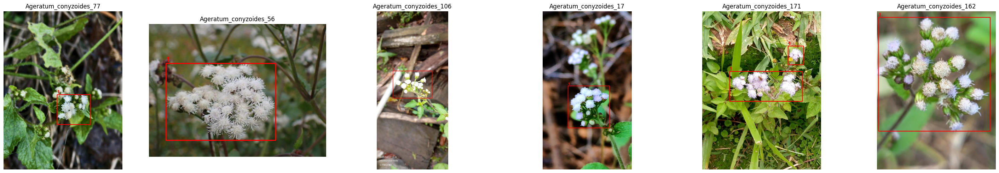


🔎 Clitoria


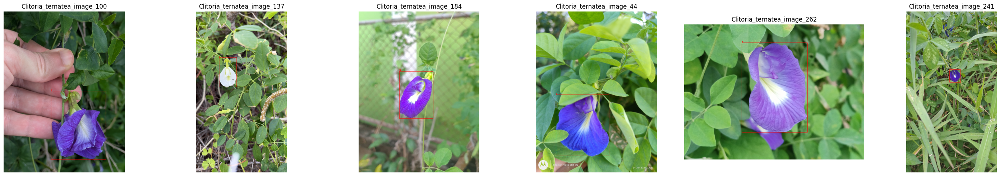


🔎 Lantana


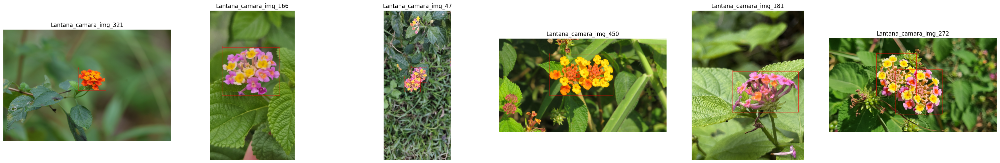


🔎 Merremia


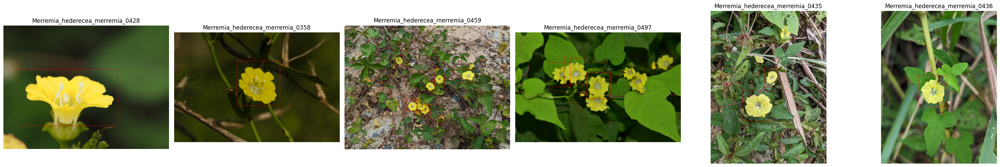


🔎 Vachellia


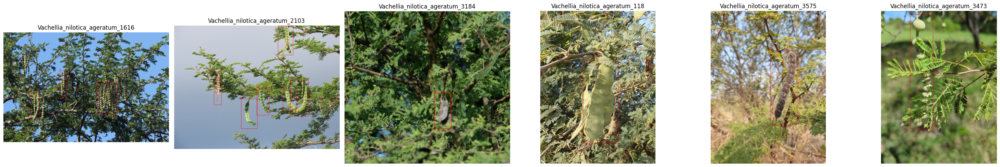

In [12]:
def visualize_samples_per_species(n_samples=3):
    files = list(LBL_INT.glob("*.txt"))

    # group by species prefix
    species_groups = {}
    for f in files:
        prefix = f.stem.split("_")[0]
        species_groups.setdefault(prefix, []).append(f)

    for species, label_files in species_groups.items():
        print(f"\n🔎 {species}")

        samples = random.sample(label_files, min(n_samples, len(label_files)))

        cols = 6
        rows = math.ceil(len(samples) / cols)

        fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
        axes = axes.flatten() if rows > 1 else axes

        for i, lbl_file in enumerate(samples):
            img_file = None
            
            for ext in IMG_EXT:
                temp_file = IMG_INT / (lbl_file.stem + ext)
                if temp_file.exists():
                    img_file = temp_file
                    break
            
            if img_file is None:
                axes[i].axis("off")
                continue

            img = cv2.imread(str(img_file))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            h, w, _ = img.shape

            with open(lbl_file, "r") as f:
                lines = f.readlines()

            for line in lines:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue

                cls, x, y, bw, bh = map(float, parts)

                x1 = int((x - bw/2) * w)
                y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w)
                y2 = int((y + bh/2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(img, str(int(cls)), (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

            axes[i].imshow(img)
            axes[i].set_title(lbl_file.stem)
            axes[i].axis("off")

        # hide unused subplot
        for j in range(i+1, len(axes)):
            axes[j].axis("off")

        plt.tight_layout()
        plt.show()
    
visualize_samples_per_species(6)

# Adding Noise

In [13]:
def add_noise_to_dataset():
    img_files = [f for f in NOISE_DIR.iterdir() if f.suffix.lower() in IMG_EXT]

    print(f"Adding {len(img_files)} noise images...")

    for i, img_file in enumerate(img_files):
        stem = img_file.stem

        new_stem = f"noise_{stem}"

        img_dst = IMG_INT / f"{new_stem}{img_file.suffix}"
        lbl_dst = LBL_INT / f"{new_stem}.txt"

        # copy image
        shutil.copy2(img_file, img_dst)

        # create empty label
        with open(lbl_dst, "w") as f:
            pass 

    print("✅ Noise added with empty labels")

add_noise_to_dataset()

Adding 144 noise images...
✅ Noise added with empty labels


## Merge to Final Dataset

Copy all processed images and labels to final folder for training/validation.

In [14]:
def merge_to_final():
    for img_file in IMG_INT.iterdir():
        shutil.copy2(img_file, IMG_OUT / img_file.name)

    for lbl_file in LBL_INT.iterdir():
        shutil.copy2(lbl_file, LBL_OUT / lbl_file.name)

    print("✅ Final dataset ready")

merge_to_final()

✅ Final dataset ready


In [15]:
def final_dataset_check(img_dir, lbl_dir):
    imgs = {f.stem for f in img_dir.iterdir() if f.suffix.lower() in IMG_EXT}
    lbls = {f.stem for f in lbl_dir.iterdir() if f.suffix == ".txt"}

    print("=== FINAL DATASET CHECK ===")
    print(f"Total images : {len(imgs)}")
    print(f"Total labels : {len(lbls)}")

    missing_labels = imgs - lbls
    missing_images = lbls - imgs

    print(f"\nMissing labels : {len(missing_labels)}")
    print(f"Missing images : {len(missing_images)}")

    if missing_labels:
        print("\nExample missing labels:")
        print(list(missing_labels)[:5])

    if missing_images:
        print("\nExample missing images:")
        print(list(missing_images)[:5])

    if len(missing_labels) == 0 and len(missing_images) == 0:
        print("\n✅ Dataset perfectly paired (ready for YOLO)")
    else:
        print("\n❌ Dataset has pairing issues")

final_dataset_check(IMG_OUT, LBL_OUT)

=== FINAL DATASET CHECK ===
Total images : 1369
Total labels : 1369

Missing labels : 0
Missing images : 0

✅ Dataset perfectly paired (ready for YOLO)


In [16]:
# final dataset summary
dataset_statistics(LBL_OUT)
image_per_class(LBL_OUT)

=== DATASET STATISTICS ===
Total images       : 1369
Empty labels       : 156

Object count per class:
Class 0: 586
Class 1: 404
Class 2: 407
Class 3: 266
Class 4: 375

Image count per class:
Class 0: 249
Class 1: 250
Class 2: 248
Class 3: 241
Class 4: 225


## Summary

✅ Pipeline complete! The final dataset is ready for:
- YOLO training
- Model validation
- Inference testing

All data is stored in `dataset/final/` with proper class labels and standardized filenames.